In [69]:
#imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [70]:
bank_data = pd.read_csv('data/bank_data.csv')
df = bank_data.copy()

In [71]:
#DataFrame overview
df.head()

,id,x_coordinate,y_coordinate,money,time (hr)
0,0,2.851925,1.201712,29700,0.273403
1,1,4.150372,-2.654334,6500,0.064040
2,2,-1.494092,-1.230419,89400,0.127458
3,3,1.271326,-0.088520,96100,1.315029
4,4,2.471113,-0.592810,41100,0.164393


In [72]:
#checking for data cleaning to do and data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            10000 non-null  int64  
 1   x_coordinate  10000 non-null  float64
 2   y_coordinate  10000 non-null  float64
 3   money         10000 non-null  int64  
 4   time (hr)     10000 non-null  float64
dtypes: float64(3), int64(2)
memory usage: 390.8 KB


In [73]:
#DataFrame overview continued : Getting minimum of each coordinates (x, y)
print(df.x_coordinate.min())
print(df.y_coordinate.min())

-4.9992917567064135
-4.999927875029058


In [74]:
#DataFrame overview continued : Getting maximum of each coordinates (x, y)
print(df.x_coordinate.max())
print(df.y_coordinate.max())

4.999851058983772
4.999626115651502


In [75]:
#if represented on a graph, the grid will range from -5 (excluded) to 5 for both x and y
#let's try to visualize them

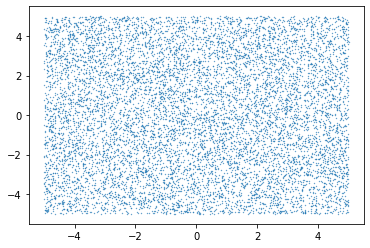

In [76]:
#let's visualize the banks' location on a scatter plot
plt.scatter(x='x_coordinate', y='y_coordinate', data=df, s=0.1)

In [77]:
#taken from check_solution.py
import math


def distance(x1, y1, x2, y2):
    return math.hypot(x2 - x1, y2 - y1)

def check_solution(travel_list, df, speed=30.):
    """
    Check a bank robber algorithm solution
    
    input:
    ------
    travel_list: a list of integers
        Your solution to the bank robber problem
        Bank IDs are row indeces into the df passed
    df: pd.DataFrame
        The algorithm input formatted dataframe 
        (id,x_coordinate,y_coordinate,money,time (hr))
    speed: float
        The km/h speed of travel
    """
    t_remaining = 24.
    score = 0.
    assert len(travel_list) == len(set(travel_list)), (
        "Your travel list must have unique IDs!"
    )
    prev = travel_list[0]
    for e in travel_list:
        row = df.iloc[e]
        score += row['money']
        t_remaining -= row['time (hr)']
        dist = distance(
            row['x_coordinate'], row['y_coordinate'],
            df.iloc[prev]['x_coordinate'],
            df.iloc[prev]['y_coordinate'],
        )
        t_remaining -= dist / speed
        prev = e
    assert t_remaining >= 0, (
        f"Used more than 24h! Time left: {t_remaining}"
    )
    # still gotta get to (0, 0)
    dist = distance(row['x_coordinate'],row['y_coordinate'],0,0)
    final_t = t_remaining - (dist / speed)
    assert final_t >= 0, (
        f"Not enough time to get to helicopter!\n"
        f"Time left after last bank: {t_remaining}\n"
        f"Distance to (0,0) helipad: {dist}\n"
    )
    print(f"Time Remaining: {final_t}")
    return score

In [78]:
#the algorithm takes about a little less than two minutes to run on a Mac with minimum specs
import math

total_hours = 24 
speed = 30 #representing the speed at which we are moving
radius = total_hours #maximum distance between one bank to the other with remaining kilometers constaint
money_robbed = 0 #defining and assigning the money robbed from banks to 0 

max_ratio = 0 #the maximum ratio (money/time)
max_ratio_id = 0 #id

x_max = 0
y_max = 0
bank_list = [] #variable will hold ids of banks with maximized ratio
df['ratio'] = df.money / df['time (hr)']


def maximizing_money_from_bank_robbery(rad = total_hours, origin_x = x_max, origin_y= y_max):
    """
    Return a list of banks to rob in less than 24 hours while moving at a rate of 30km/h and while maximizing the money/    time ratio.
    
    inputs:
    ------
    rad (optional, 24 by default): 
        The radius whose purpose is to create a circle around every bank with a ratio that maximizes the money to rob            while taking into consideration the time needed to actually rob it to make sure the next bank to be robbed does          not exceed the time there is left on the 24 hour time frame limit.
    origin_x, origin_y (optional, 0 by default): 
        The x, y coordinates of the current bank being robbed (with the maximum money/time ratio to be used as the               center of the circle). Starts at 0 because we need to take the helicopter in order to evade after our 24-hour            robbing spree. We will reverse the banks' order to finish at 0,0 coordinates.
    
    """
    #making variables available in the function definition
    global total_hours
    global speed
    global radius
    global money_robbed
    global max_ratio
    global max_ratio_id
    global x_max
    global y_max
    global bank_list

    #as long as total_hours is positive, loop
    while total_hours > 0:
        #iterating 10000 rows of df
        for i in df.id:
            #if bank has not already been robbed
            if i not in bank_list:
                #if bank is inside an imaginary circle whose radius is the time left to rob
                #Reference : https://www.geeksforgeeks.org/find-if-a-point-lies-inside-or-on-circle/
                if (((df.x_coordinate[i] - origin_x) * (df.x_coordinate[i] - origin_x) + (df.y_coordinate[i] - origin_y) * (df.y_coordinate[i] - origin_y) <= rad * rad).any()) & (df.at[i, 'ratio'] > max_ratio):
                    max_ratio = df.at[i, 'ratio'] #taking the maximum ratio (money/time)
                    new_i = i #id of maximum ratio as two different banks can have same amount of money to steal
                    money = df.at[i, 'money'] #amount of money of this particular bank
        

        money_robbed += money #add money to the previous amounts robbed
        max_ratio_id = new_i 
        bank_list.append(max_ratio_id) #add id of bank with maximum money/time ratio
        time = df.at[new_i, 'time (hr)'] #variable representing amount of time to spend in the bank to get money
        x_max = df.at[new_i, 'x_coordinate'] #get x coordinate to calculate distance
        y_max = df.at[new_i, 'y_coordinate'] #get y coordinate to calculate distance
        max_ratio = 0 #reset the max ratio to 0
        distance = (((x_max - origin_x)**2) + ((y_max - origin_y)**2))**0.5 #calculate distance between 2 coordinates
        new_origin_x = x_max #replace x coordinate to create new origin
        new_origin_y = y_max #replace y coordinate to create new origin
        total_hours -= (distance / 30 + time) #update time left
        rad = total_hours #update radius according to time left
        maximizing_money_from_bank_robbery(rad, new_origin_x, new_origin_y) #call function again with updated radius and         coordinates
        

%time maximizing_money_from_bank_robbery()

print(f'There are exactly {len(bank_list)} to rob in less than 24 hours to maximize profits amounting to: ${money_robbed}.')
print('\n')
print(f'The list of banks to steal from is the following: {bank_list}.')

CPU times: user 1min 38s, sys: 533 ms, total: 1min 39s
Wall time: 1min 45s
There are exactly 149 to rob in less than 24 hours to maximize profits amounting to: $7712300.


The list of banks to steal from is the following: [3613, 9546, 3803, 6528, 9583, 5933, 9195, 4757, 8550, 4499, 9241, 7343, 3798, 7544, 4762, 8436, 8562, 6097, 487, 2928, 5135, 865, 3914, 4987, 3466, 7560, 8579, 8690, 8469, 433, 524, 6468, 1914, 1757, 8287, 7258, 4725, 8206, 4605, 7064, 3926, 9401, 9736, 2331, 9653, 7074, 2346, 8966, 4696, 8022, 4789, 6740, 9881, 70, 2656, 951, 209, 58, 9228, 3193, 8525, 5610, 2037, 4287, 6022, 2827, 8849, 9378, 6104, 2741, 7701, 8355, 5563, 3005, 7665, 6987, 5719, 2729, 1997, 8286, 4906, 613, 790, 7087, 5126, 5562, 3516, 2243, 6759, 3026, 1372, 2442, 1733, 8375, 7764, 7649, 7689, 517, 3297, 4794, 9880, 3089, 7583, 5725, 4345, 2190, 5155, 9049, 7595, 444, 6712, 2521, 8703, 5295, 299, 6216, 8908, 7877, 5622, 5296, 9275, 4465, 6535, 8231, 8846, 507, 5166, 4807, 6764, 670, 6254, 6375, 14

In [79]:
bank_list.pop(-1) #removing the last element in the list because it exceeds the 24-hour time limit
bank_list.reverse() #reversing the list so that the robbing spree finishes at 0,0 
check_solution(bank_list, df)

Time Remaining: 0.11395910070246777


7625900.0

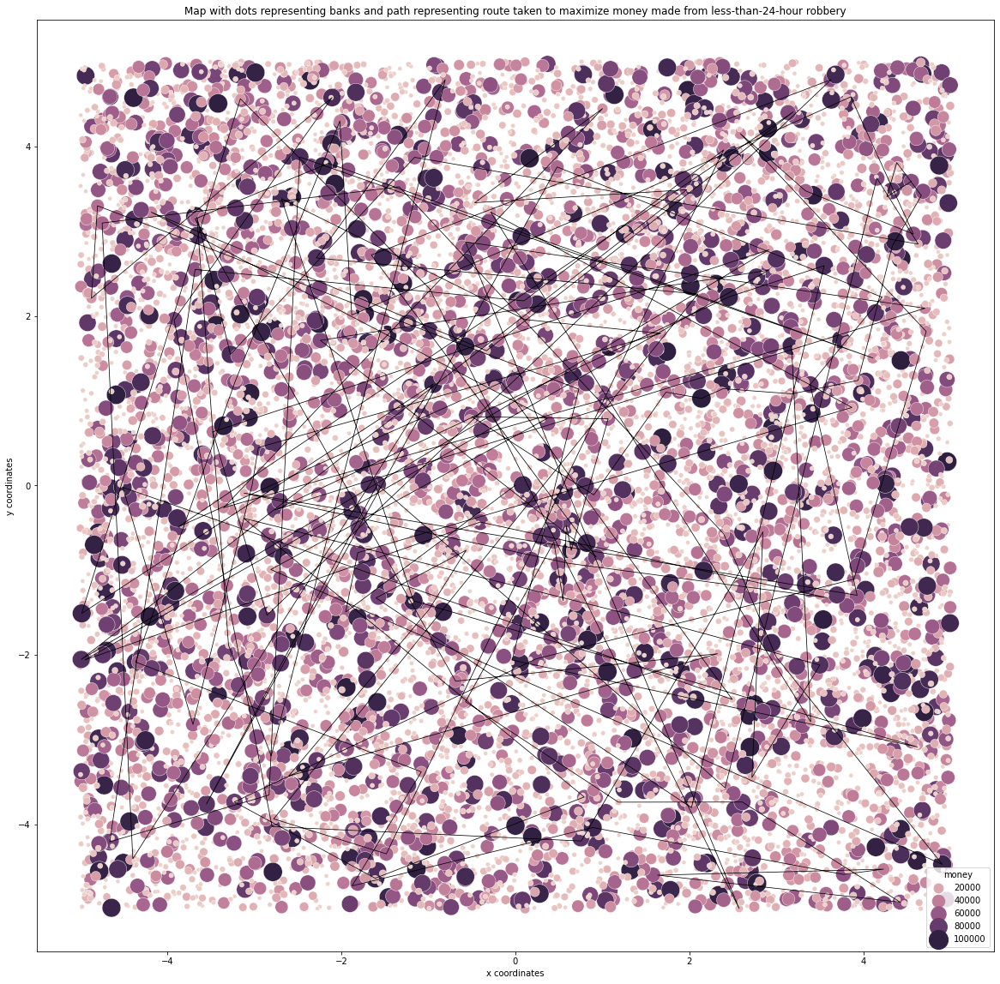

In [80]:
#let's visualze the map route
plt.figure(figsize=(20,20))
sns.scatterplot(data=df, x="x_coordinate", y="y_coordinate", hue="money", size="money", sizes=(25, 500))

df2 = pd.DataFrame(bank_list, columns=['id'])
df2 = df2.merge(df, left_on='id', right_on='id')
df2 = df2.append(pd.DataFrame([[0, 0]], columns=['x_coordinate', 'y_coordinate']))
plt.plot(df2['x_coordinate'], df2['y_coordinate'], c='k', lw=0.75)
plt.title('Map with dots representing banks and lines representing route taken to maximize money made from 24-hour robbery')
plt.xlabel('x coordinates')
plt.ylabel('y coordinates')
plt.show()